Esta notebook tiene como objetivo utilizar una técnica de aprendizaje no supervisado sobre el dataset utilizado en el primer práctico de la mentoría. Para ello, se trabaja con el segundo archivo csv que se generó en el segundo entregable:
- datescards.csv Este csv cuenta con una fila por cada tarjeta en la que se listan las fechas en las cuales la misma fue utilizada con la siguiente estructura: |'card-id'|'date-1'|'date-2'|'date-3'|... donde card-id es le número de la tarjeta continuada con a lista de date-N en las cuales la misma fue usada.

A partir de dicho dataset, se llega a uno más simple sobre el cual se termina aplicando K-means para obtener distintos grupos de usuarios de acuerdo al porcentaje de viajes que realizaron los días hábiles y los días del fin de semana.

# IMPORTS

In [1]:
import pandas as pd
import numpy as np
import datetime
from plotly.offline import init_notebook_mode, plot,iplot
import plotly.graph_objs as go
init_notebook_mode(connected=True)
import matplotlib.pyplot as plt
import plotly.tools as tls#visualization
import plotly.figure_factory as ff#visualization
import seaborn as sns
import plotly.express as px

In [2]:
from sklearn.cluster import KMeans,MeanShift
from sklearn import decomposition

# READ

In [3]:
# leemos el archivo datescards.csv
df = pd.read_csv("processed-data/datescards.csv", header=None, names=range(2046))

/tmp/ipykernel_153/3866985090.py:2: DtypeWarning:

Columns (643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,

In [25]:
df.shape

(118691, 2046)

In [26]:
df.head()

,0,1,2,3,4,5,6,7,8,9,...,2036,2037,2038,2039,2040,2041,2042,2043,2044,2045
0,4992639,2019-01-01 01:32:43,2019-01-02 19:54:39,2019-01-03 08:56:26,2019-01-03 20:18:25,2019-01-05 08:42:00,2019-01-05 11:45:07,2019-01-06 19:15:26,2019-01-07 12:35:28,2019-01-07 19:54:08,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,5489022,2019-01-01 02:26:11,2019-01-01 02:26:14,2019-01-01 21:55:17,2019-01-02 05:55:23,2019-01-02 21:50:24,2019-01-03 05:56:06,2019-01-03 08:32:58,2019-01-03 08:32:59,2019-01-03 21:49:21,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,5317539,2019-01-01 02:32:27,2019-01-01 07:36:03,2019-01-01 10:59:13,2019-01-02 18:46:19,2019-01-02 21:37:19,2019-01-02 22:08:41,2019-01-03 08:32:16,2019-01-03 12:47:31,2019-01-03 13:32:27,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4451141,2019-01-01 02:57:48,2019-01-01 09:23:32,2019-01-01 23:05:17,2019-01-03 16:24:32,2019-01-03 23:48:28,2019-01-04 15:40:34,2019-01-05 16:29:19,2019-01-05 22:53:01,2019-01-08 16:06:04,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,6002199,2019-01-01 03:03:55,2019-01-01 22:02:44,2019-01-01 22:02:46,2019-01-02 08:02:46,2019-01-02 08:02:49,2019-01-02 19:08:50,2019-01-03 08:01:47,2019-01-03 08:37:00,2019-01-05 20:12:58,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [27]:
df.dtypes

0        int64
1       object
2       object
3       object
4       object
         ...  
2041    object
2042    object
2043    object
2044    object
2045    object
Length: 2046, dtype: object

# PRE-PROCESSING

In [6]:
cols = df.columns[1:2046]

In [7]:
# convertimos a datetime cada uno de los valores del dataframe 
df = df[cols].apply(pd.to_datetime, errors='coerce')

In [8]:
df.head()

,1,2,3,4,5,6,7,8,9,10,...,2036,2037,2038,2039,2040,2041,2042,2043,2044,2045
0,2019-01-01 01:32:43,2019-01-02 19:54:39,2019-01-03 08:56:26,2019-01-03 20:18:25,2019-01-05 08:42:00,2019-01-05 11:45:07,2019-01-06 19:15:26,2019-01-07 12:35:28,2019-01-07 19:54:08,2019-01-08 07:55:10,...,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT
1,2019-01-01 02:26:11,2019-01-01 02:26:14,2019-01-01 21:55:17,2019-01-02 05:55:23,2019-01-02 21:50:24,2019-01-03 05:56:06,2019-01-03 08:32:58,2019-01-03 08:32:59,2019-01-03 21:49:21,2019-01-03 21:49:23,...,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT
2,2019-01-01 02:32:27,2019-01-01 07:36:03,2019-01-01 10:59:13,2019-01-02 18:46:19,2019-01-02 21:37:19,2019-01-02 22:08:41,2019-01-03 08:32:16,2019-01-03 12:47:31,2019-01-03 13:32:27,2019-01-03 19:42:03,...,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT
3,2019-01-01 02:57:48,2019-01-01 09:23:32,2019-01-01 23:05:17,2019-01-03 16:24:32,2019-01-03 23:48:28,2019-01-04 15:40:34,2019-01-05 16:29:19,2019-01-05 22:53:01,2019-01-08 16:06:04,2019-01-08 22:42:51,...,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT
4,2019-01-01 03:03:55,2019-01-01 22:02:44,2019-01-01 22:02:46,2019-01-02 08:02:46,2019-01-02 08:02:49,2019-01-02 19:08:50,2019-01-03 08:01:47,2019-01-03 08:37:00,2019-01-05 20:12:58,2019-01-05 22:06:17,...,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT


In [10]:
# obtenemos el día de la semana en que se usó cada tarjeta
for n in cols:
    df[n] = df[n].apply(lambda x: pd.to_datetime(x).weekday())

In [11]:
df

,1,2,3,4,5,6,7,8,9,10,...,2036,2037,2038,2039,2040,2041,2042,2043,2044,2045
0,1,2,3,3,5,5,6,0,0,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,1,1,2,2,3,3,3,3,3,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1,1,1,2,2,2,3,3,3,3,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1,1,1,3,3,4,5,5,1,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1,1,1,2,2,2,3,3,5,5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
118686,3,3,3,3,3,3,3,4,4,4,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
118687,3,3,3,4,4,4,4,4,4,6,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
118688,3,3,3,3,3,5,5,6,6,6,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
118689,3,3,3,3,3,4,4,4,4,5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [12]:
#exportamos el csv para evitar tener que repetir el proceso anterior cada vez que accedemos a la notebook
df.to_csv("../datescards_2.csv", index=False)

# PROCESSING

In [4]:
# partimos del nuevo dataset donde en cada fila tenemos las tarjetas utilizadas y cada valor representa el número de día de la semana en que se usó
df1 = pd.read_csv("processed-data/datescards_2.csv", header=None, names=range(2046))

In [5]:
df1

,0,1,2,3,4,5,6,7,8,9,...,2036,2037,2038,2039,2040,2041,2042,2043,2044,2045
0,1,2,3,4,5,6,7,8,9,10,...,2037.0,2038.0,2039.0,2040.0,2041.0,2042.0,2043.0,2044.0,2045.0,NaN
1,1,2,3,3,5,5,6,0,0,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1,1,1,2,2,3,3,3,3,3,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1,1,1,2,2,2,3,3,3,3,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1,1,1,3,3,4,5,5,1,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
118687,3,3,3,3,3,3,3,4,4,4,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
118688,3,3,3,4,4,4,4,4,4,6,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
118689,3,3,3,3,3,5,5,6,6,6,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
118690,3,3,3,3,3,4,4,4,4,5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [6]:
df1 = df1.rename(columns=df1.iloc[0]).drop(df1.index[0]).iloc[: , :-1]

In [7]:
df1 = df1.reset_index()

In [8]:
df1 = df1.drop('index', axis=1)

In [9]:
# agregamos una columna que calcule la cantidad de usos totales de cada tarjeta
df1['usos_totales'] = df1.count(axis=1, numeric_only= True)

In [10]:
# agregamos columnas que indiquen la cantidad de veces que se usó la tarjeta en días laborales de lunes a viernes ('dia_lab'),
# los sábados ('sabado') o los domingos ('domingo')
# weekday:0 = monday, 1 = tuesday, 2 = wednesday, 3 = thursday, 4 = friday, 5 = saturday, 6 = sunday
df1['dia_lab'] = (df1.isin([0,1,2,3,4])).sum(axis=1)
df1['sabado'] = (df1 == 5).sum(axis=1)
df1['domingo'] = (df1 == 6).sum(axis=1)

In [11]:
df1['usos_totales'].value_counts()

255     502
271     490
284     479
265     476
279     475
       ... 
1627      1
1316      1
1162      1
1305      1
143       1
Name: usos_totales, Length: 1265, dtype: int64

In [12]:
#la tarjeta menos usada se utilizó 134 veces y la más utilizada, 2045 veces
df1['usos_totales'].sort_values()

116138     134
67462      137
49186      138
87786      140
117441     141
          ... 
31321     1849
59424     1963
35028     1976
26562     2044
1431      2045
Name: usos_totales, Length: 118691, dtype: int64

In [13]:
df1['usos_totales'].mean()

394.3863393180612

In [14]:
# definimos un dataframe de una columna con el número de las tarjetas a partir del datframe original
df2 = df.iloc[:, 0]

In [15]:
# le agregamos al dataframe anterior la primera columna que indica el número de cada tarjeta 
df3 = pd.concat([df2, df1], axis=1, join='inner')

In [16]:
# definimos un nuevo dataframe
df4 = df3[[0, 'usos_totales', 'dia_lab', 'sabado', 'domingo']]

In [17]:
# cambiamos el nombre de las columnas del nuevo dataframe
df4.columns =['tarjetas', 'usos_totales', 'dia_lab', 'sabado', 'domingo']

In [18]:
# agregamos columnas que indicen el porcentaje de viajes que se realizaron en días laborales, los sábados y los domingos
df4['dia_lab_part'] = df4.dia_lab / df4.usos_totales
df4['sabado_part'] = df4.sabado / df4.usos_totales
df4['domingo_part'] = df4.domingo / df4.usos_totales

In [19]:
# así queda definido nuestro dataframe final sobre el cual vamos a trabajar
df4

,tarjetas,usos_totales,dia_lab,sabado,domingo,dia_lab_part,sabado_part,domingo_part
0,4992639,371,304,38,29,0.819407,0.102426,0.078167
1,5489022,368,293,16,59,0.796196,0.043478,0.160326
2,5317539,762,619,89,54,0.812336,0.116798,0.070866
3,4451141,433,224,111,98,0.517321,0.256351,0.226328
4,6002199,799,552,134,113,0.690864,0.167710,0.141427
...,...,...,...,...,...,...,...,...
118686,6214380,528,411,79,38,0.778409,0.149621,0.071970
118687,6229262,479,442,13,24,0.922756,0.027140,0.050104
118688,6211856,259,220,18,21,0.849421,0.069498,0.081081
118689,4533744,462,341,75,46,0.738095,0.162338,0.099567


# ANALYSIS

In [20]:
df4.describe()

,tarjetas,usos_totales,dia_lab,sabado,domingo,dia_lab_part,sabado_part,domingo_part
count,1.186910e+05,118691.000000,118691.000000,118691.000000,118691.000000,118691.000000,118691.000000,118691.000000
mean,4.939127e+06,394.386339,340.363684,36.289988,17.750099,0.864894,0.090552,0.044612
std,1.262660e+06,172.659578,151.690945,31.194085,23.164199,0.100113,0.063871,0.052105
min,2.016806e+06,134.000000,3.000000,0.000000,0.000000,0.008086,0.000000,0.000000
25%,4.081033e+06,272.000000,234.000000,13.000000,2.000000,0.803974,0.038194,0.005556
50%,5.122224e+06,348.000000,302.000000,29.000000,9.000000,0.877264,0.085821,0.025735
75%,5.798196e+06,466.000000,408.000000,51.000000,25.000000,0.945623,0.133136,0.067961
max,1.018890e+07,2045.000000,1682.000000,370.000000,421.000000,1.000000,0.991914,0.750000


In [21]:
df4[df4['sabado_part']>0.70]

,tarjetas,usos_totales,dia_lab,sabado,domingo,dia_lab_part,sabado_part,domingo_part
68098,3442977,261,46,197,18,0.176245,0.754789,0.068966
86949,4459821,285,80,203,2,0.280702,0.712281,0.007018
107450,5337936,337,60,272,5,0.178042,0.807122,0.014837
109118,5911447,371,3,368,0,0.008086,0.991914,0.000000


In [22]:
df4[df4['domingo_part']>0.70]

,tarjetas,usos_totales,dia_lab,sabado,domingo,dia_lab_part,sabado_part,domingo_part
3941,3979685,218,16,48,154,0.073394,0.220183,0.706422
6684,3475187,280,57,13,210,0.203571,0.046429,0.750000
59554,4375794,284,72,8,204,0.253521,0.028169,0.718310


<AxesSubplot:>

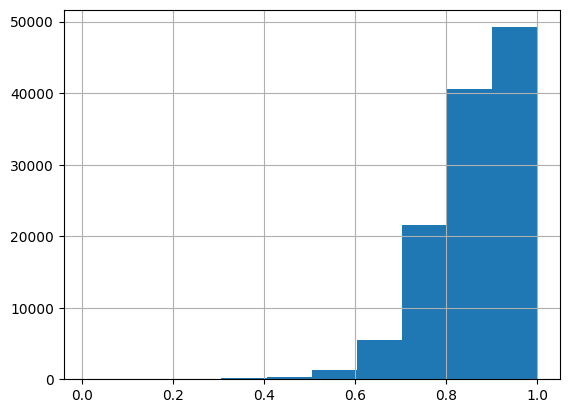

In [26]:
df4['dia_lab_part'].hist()

<AxesSubplot:>

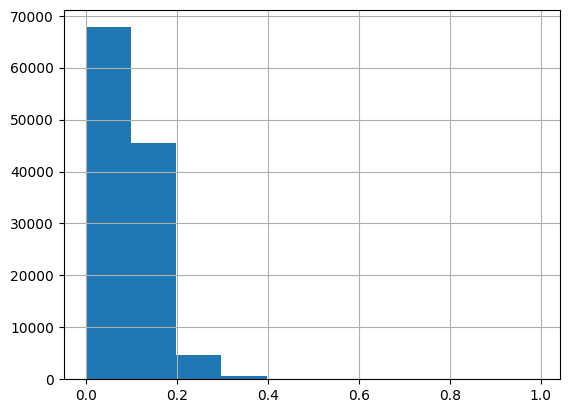

In [27]:
df4['sabado_part'].hist()

In [24]:
#diferenciamos a las tarjetas de mayor uso
tarj_mas_usos=df4["usos_totales"] > 1500


In [71]:
len(df4[tarj_mas_usos]) / len (df4)

0.000286458113926077

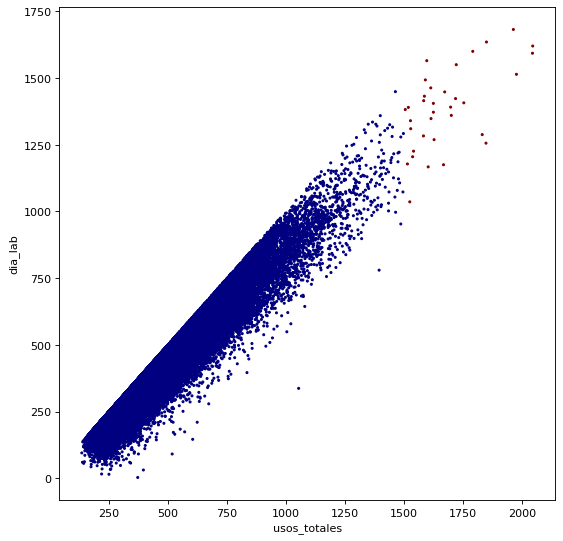

In [29]:
plt.figure(figsize=(8,8), dpi=80)
plt.scatter(df4['usos_totales'], y=df4['dia_lab'],s=3,c=tarj_mas_usos, cmap='jet')
plt.xlabel('usos_totales')
plt.ylabel('dia_lab')
plt.show()

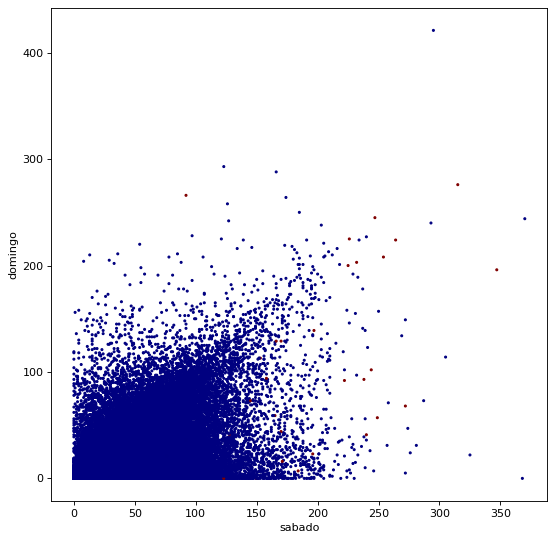

In [30]:
plt.figure(figsize=(8,8), dpi=80)
plt.scatter(df4['sabado'], y=df4['domingo'],s=3,c=tarj_mas_usos, cmap='jet')
plt.xlabel('sabado')
plt.ylabel('domingo')
plt.show()

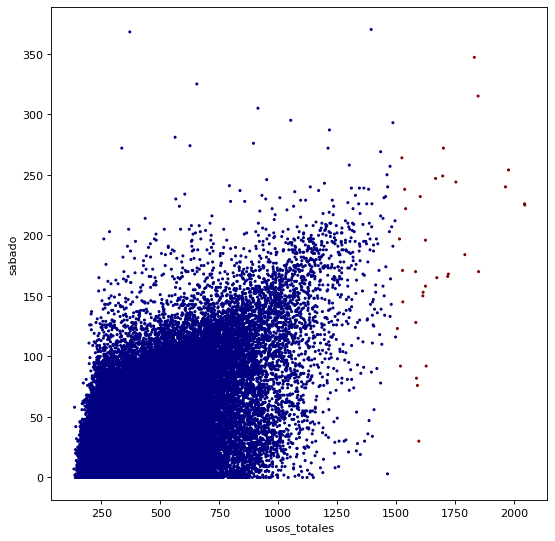

In [29]:
plt.figure(figsize=(8,8), dpi=80)
plt.scatter(df4['usos_totales'], y=df4['sabado'],s=3,c=tarj_mas_usos, cmap='jet')
plt.xlabel('usos_totales')
plt.ylabel('sabado')
plt.show()

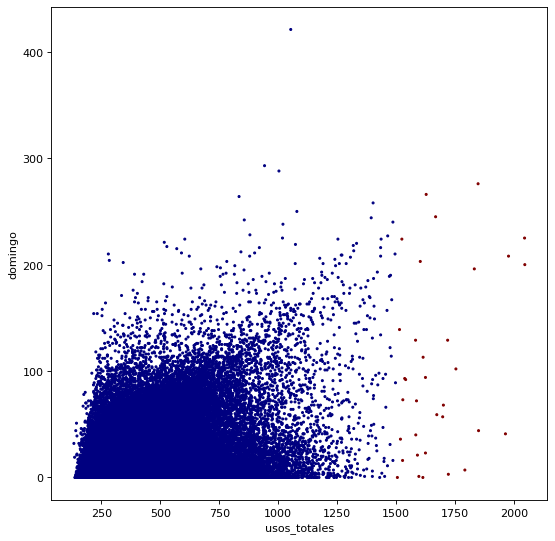

In [30]:
plt.figure(figsize=(8,8), dpi=80)
plt.scatter(df4['usos_totales'], y=df4['domingo'],s=3,c=tarj_mas_usos, cmap='jet')
plt.xlabel('usos_totales')
plt.ylabel('domingo')
plt.show()

# KMEANS

Cuando incluimos la variable 'usos_totales', se obtienen clusters similares. Por eso elegimos excluirla

In [37]:
df_var_cluster = df4[[ 'dia_lab_part', 'sabado_part']]

Text(0.5, 1.0, 'Inertia of k-Means versus number of clusters')

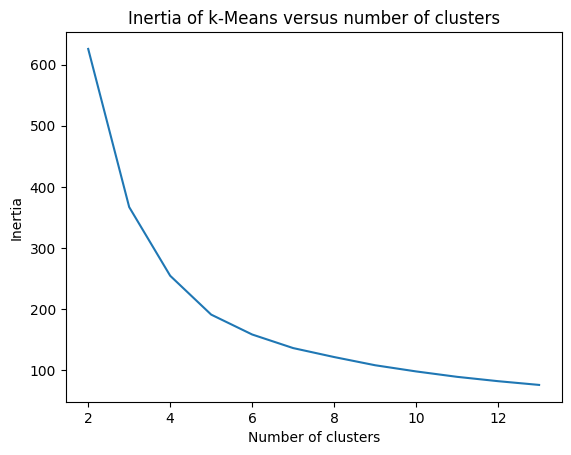

In [38]:
#Prueba: para elegir el hiperparámetro n_clusters, variando de 2 a 14 clusters.
# Acá observamos que "el codo" marca 7 clusters, por lo que corremos de nuevo eligiendo esa cantidad
scores = [KMeans(n_clusters=i).fit(df_var_cluster).inertia_ for i in range(2,14)]

plt.plot(np.arange(2, 14), scores)
plt.xlabel('Number of clusters')
plt.ylabel("Inertia")
plt.title("Inertia of k-Means versus number of clusters")

El punto de inflexión de la curva pareciera ser en el 7

In [39]:
# Número de clusters buscado. 
n_clust = 7

km = KMeans(n_clusters=n_clust)
km.fit(df_var_cluster)

# Etiquetas asignadas por el algoritmo
clusters = km.labels_
#print('Suma de los cuadrados de las distancias al centro de cada cluster=Inertia= ', km.inertia_)

In [50]:
df_kmeans=df4.copy()
df_kmeans['kmeans'] = km.labels_ #clusters
df_kmeans.head()

,tarjetas,usos_totales,dia_lab,sabado,domingo,dia_lab_part,sabado_part,domingo_part,kmeans
0,4992639,371,304,38,29,0.819407,0.102426,0.078167,4
1,5489022,368,293,16,59,0.796196,0.043478,0.160326,0
2,5317539,762,619,89,54,0.812336,0.116798,0.070866,4
3,4451141,433,224,111,98,0.517321,0.256351,0.226328,6
4,6002199,799,552,134,113,0.690864,0.167710,0.141427,3


In [64]:
df_kmeans.groupby('kmeans')[['dia_lab', 'sabado', 'domingo']].sum()

,dia_lab,sabado,domingo
kmeans,,,
0,8207438,876903,353933
1,9550391,151024,52486
2,4780558,985699,659801
3,1341907,410384,290433
4,7761121,1267363,487787
5,8579597,505213,189342
6,177094,110709,72995


In [65]:
df_kmeans.groupby('kmeans')[['dia_lab_part', 'sabado_part', 'domingo_part']].mean()

,dia_lab_part,sabado_part,domingo_part
kmeans,,,
0,0.869501,0.092408,0.038095
1,0.979903,0.015034,0.005288
2,0.744196,0.154226,0.101578
3,0.655719,0.203818,0.140464
4,0.815266,0.132408,0.052327
5,0.925183,0.054405,0.020447
6,0.487916,0.310692,0.201392


In [63]:
df_kmeans['kmeans'].value_counts()

1    26460
5    23841
0    23602
4    22607
2    15429
3     5604
6     1148
Name: kmeans, dtype: int64

/tmp/ipykernel_153/3777038795.py:10: MatplotlibDeprecationWarning:

The 'b' parameter of grid() has been renamed 'visible' since Matplotlib 3.5; support for the old name will be dropped two minor releases later.



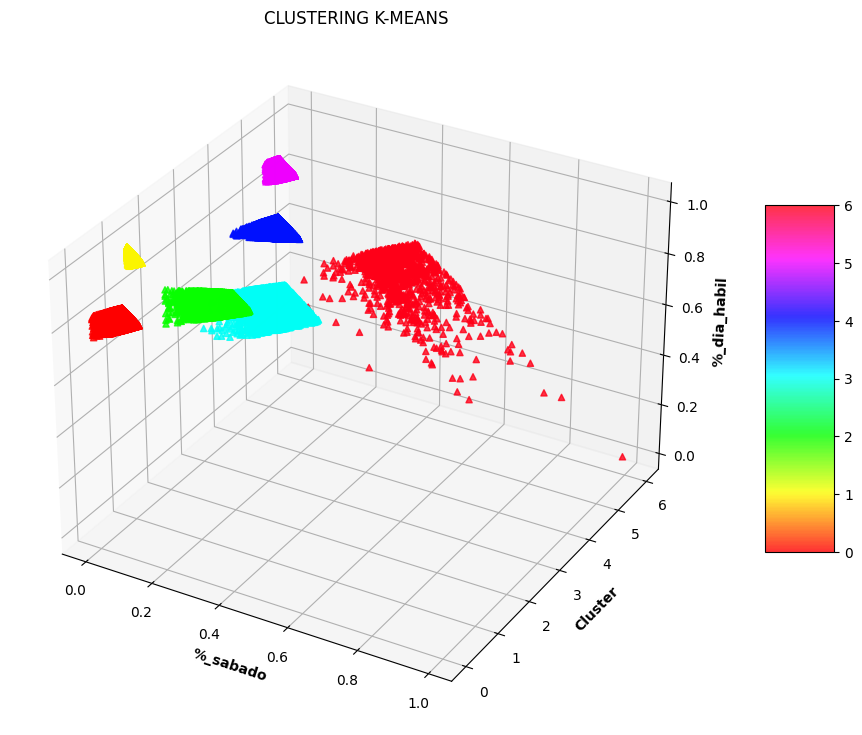

In [59]:
z = df_kmeans['dia_lab_part']
x = df_kmeans['sabado_part']
y = df_kmeans['kmeans']
 
# Creating figure
fig = plt.figure(figsize = (16, 9))
ax = plt.axes(projection ="3d")
   
# Add x, y gridlines
ax.grid(b = True, color ='grey',
        linestyle ='-.', linewidth = 0.3,
        alpha = 0.2)
 
 
# Creating color map
my_cmap = plt.get_cmap('hsv')
 
# Creating plot
sctt = ax.scatter3D(x, y, z,
                    alpha = 0.8,
                    c = (y ),
                    cmap = my_cmap,
                    marker ='^')
 
plt.title("CLUSTERING K-MEANS")
ax.set_xlabel('%_sabado', fontweight ='bold')
ax.set_ylabel('Cluster', fontweight ='bold')
ax.set_zlabel('%_dia_habil', fontweight ='bold')
fig.colorbar(sctt, ax = ax, shrink = 0.5, aspect = 5)
 
# show plot
plt.show()

/tmp/ipykernel_153/2615704331.py:10: MatplotlibDeprecationWarning:

The 'b' parameter of grid() has been renamed 'visible' since Matplotlib 3.5; support for the old name will be dropped two minor releases later.



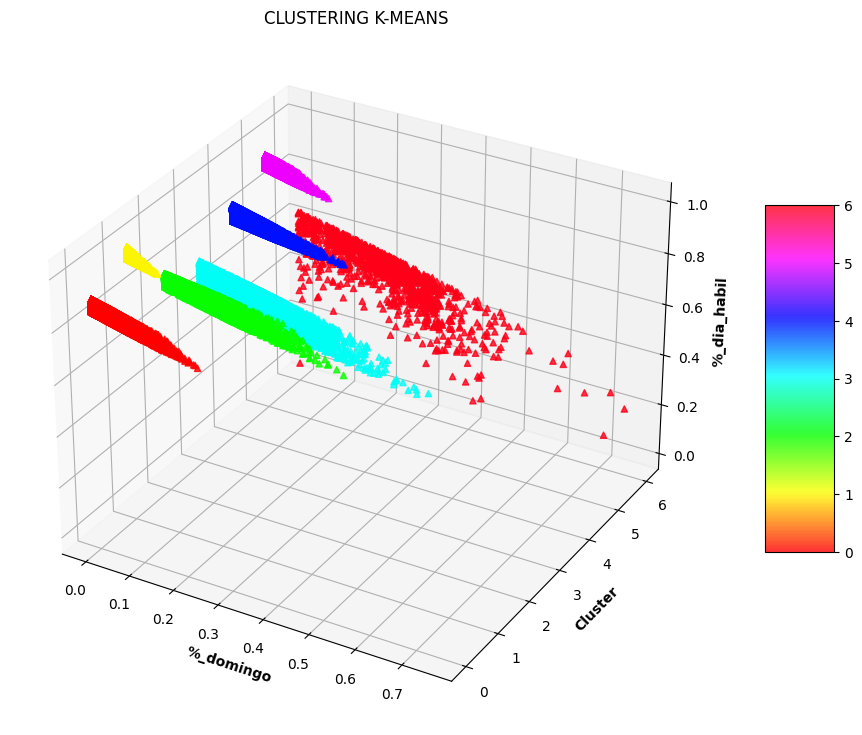

In [60]:
z = df_kmeans['dia_lab_part']
x = df_kmeans['domingo_part']
y = df_kmeans['kmeans']
 
# Creating figure
fig = plt.figure(figsize = (16, 9))
ax = plt.axes(projection ="3d")
   
# Add x, y gridlines
ax.grid(b = True, color ='grey',
        linestyle ='-.', linewidth = 0.3,
        alpha = 0.2)
 
 
# Creating color map
my_cmap = plt.get_cmap('hsv')
 
# Creating plot
sctt = ax.scatter3D(x, y, z,
                    alpha = 0.8,
                    c = (y ),
                    cmap = my_cmap,
                    marker ='^')
 
plt.title("CLUSTERING K-MEANS")
ax.set_xlabel('%_domingo', fontweight ='bold')
ax.set_ylabel('Cluster', fontweight ='bold')
ax.set_zlabel('%_dia_habil', fontweight ='bold')
fig.colorbar(sctt, ax = ax, shrink = 0.5, aspect = 5)
 
# show plot
plt.show()

/tmp/ipykernel_153/66656873.py:10: MatplotlibDeprecationWarning:

The 'b' parameter of grid() has been renamed 'visible' since Matplotlib 3.5; support for the old name will be dropped two minor releases later.



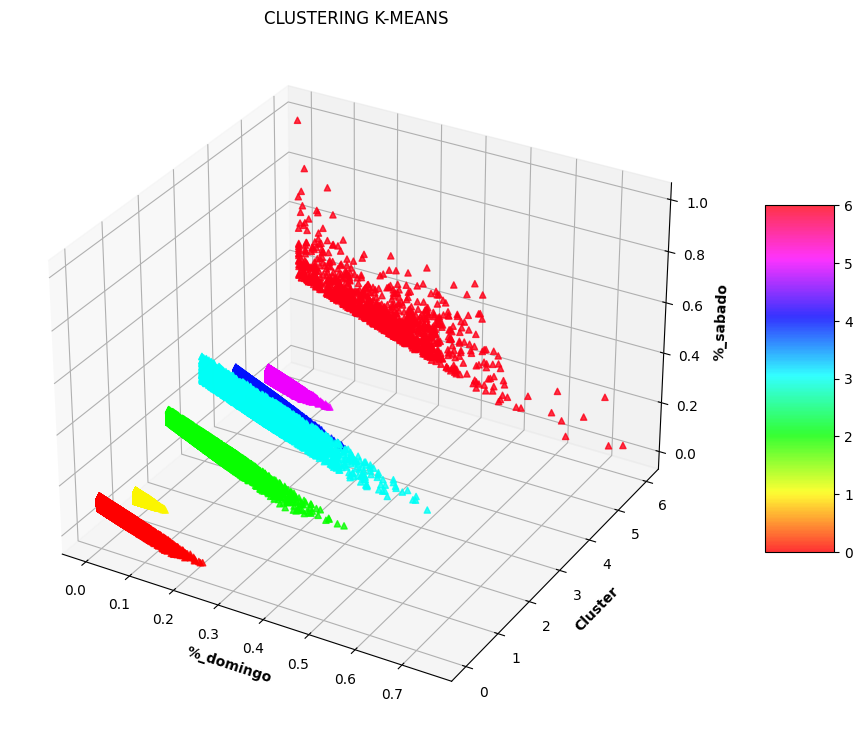

In [61]:
z = df_kmeans['sabado_part']
x = df_kmeans['domingo_part']
y = df_kmeans['kmeans']
 
# Creating figure
fig = plt.figure(figsize = (16, 9))
ax = plt.axes(projection ="3d")
   
# Add x, y gridlines
ax.grid(b = True, color ='grey',
        linestyle ='-.', linewidth = 0.3,
        alpha = 0.2)
 
 
# Creating color map
my_cmap = plt.get_cmap('hsv')
 
# Creating plot
sctt = ax.scatter3D(x, y, z,
                    alpha = 0.8,
                    c = (y ),
                    cmap = my_cmap,
                    marker ='^')
 
plt.title("CLUSTERING K-MEANS")
ax.set_xlabel('%_domingo', fontweight ='bold')
ax.set_ylabel('Cluster', fontweight ='bold')
ax.set_zlabel('%_sabado', fontweight ='bold')
fig.colorbar(sctt, ax = ax, shrink = 0.5, aspect = 5)
 
# show plot
plt.show()

In [66]:
kmean_clusters = go.Scatter(x=df_var_cluster['dia_lab_part'], y=df_var_cluster['sabado_part'],
                           mode='markers',
                           text=df4.loc[:,'tarjetas'],
                           marker=dict(
                                size=5,
                                color = clusters.astype(np.float), #set color equal to a variable
                                colorscale='Portland',
                                showscale=False)
                           )

tarjetas_mas_usadas =go.Scatter(x=df_var_cluster.loc[tarj_mas_usos,'dia_lab_part'], y=df_var_cluster.loc[tarj_mas_usos,'sabado_part'],name='tarj_mas_usos!!',
                      text=df4.loc[tarj_mas_usos,'tarjetas'],
                      textfont=dict(family='sans serif',size=10,color='black'),
                      opacity=0.9,mode='text')

data=[kmean_clusters,tarjetas_mas_usadas]

layout = go.Layout(title="Clustering K means ",titlefont=dict(size=20),
                xaxis=dict(title='%_dia_habil'),
                yaxis=dict(title='%_sabado'),
                autosize=False, width=1000,height=650)

fig = go.Figure(data=data, layout=layout)

fig.show()

/tmp/ipykernel_153/823887598.py:6: DeprecationWarning:

`np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations

